## Installing Libraries

In [1]:
%%capture
!pip install yfinance
!pip install pandas
!pip install matplotlib
!pip install seaborn
!pip install joblib
!pip install seaborn
!pip install numpy
%%capture
## https://github.com/Worlddatascience/DataScienceCohort/blob/master/6_How_to_Create_a_Candlestick_Chart_using_Python.ipynb
!pip install cufflinks
## Code to Install Backtrader
!pip install backtrader 


## Importing necessary packages

In [2]:
import yfinance
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
import cufflinks as cf   #A powerful data visualization library used for Financial Data Science processes
from plotly.offline import iplot, init_notebook_mode #Plotly and cufflinks work in conjunction

cf.go_offline() #gives ability to plot offline
init_notebook_mode() #gives ability to plot things proportionately in the notebook


In [3]:
! pip install -U kaleido
import warnings
warnings.filterwarnings('ignore')
import kaleido
import plotly.io as pio


### Ticker of interest

### Bolinger Band Strategy

In [4]:

##https://medium.com/codex/algorithmic-trading-with-bollinger-bands-in-python-1b0a00c9ef99
## https://github.com/Worlddatascience/DataScienceCohort/blob/master/6_How_to_Create_a_Candlestick_Chart_using_Python.ipynb
name = "QQQ"
#def stock(name,start,end):
def bol_band_strategy(name="QQQ",frequency="1d",first="2019-11-4", last="2022-11-15",period=20,multiplier=1.7,investment_value = 100000):
    ticker = yfinance.Ticker(name)
    df = ticker.history(interval=frequency,start=first,end=last)
    df['MiddleBand']= df['Close'].rolling(period).mean()
    df['UpperBand'] = df['Close'].rolling(period).mean() + df['Close'].rolling(period).std() * multiplier
    df['LowerBand'] = df['Close'].rolling(period).mean() - df['Close'].rolling(period).std() * multiplier
    #return df
    #def implement_bb_strategy(data, lower_bb, upper_bb):
    buy_price = []
    sell_price = []
    bb_signal = []
    signal = -1
    #data=df['Close']
    #lower_bb=df['LowerBand']
    #upper_bb=df['UpperBand']
    
    for i in range(len(df['Close'])):
        if df['Close'][i-1] > df['LowerBand'][i-1] and df['Close'][i] < df['LowerBand'][i]:
            if signal != 1:
                buy_price.append(df['Close'][i])
                sell_price.append(np.nan)
                signal = 1
                bb_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                bb_signal.append(0)
        elif df['Close'][i-1] < df['UpperBand'][i-1] and df['Close'][i] > df['UpperBand'][i]:
            if signal != -1:
                buy_price.append(np.nan)
                sell_price.append(df['Close'][i])
                signal = -1
                bb_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                bb_signal.append(0)
        else:
            buy_price.append(np.nan)
            sell_price.append(np.nan)
            bb_signal.append(0)
    df['buy_price']=buy_price
    df['sell_price']=sell_price
    df['bb_signal']=bb_signal 
        
    #return df
    position = []
    
    for i in range(len(df['bb_signal'])):
        if df['bb_signal'][i] > 1:
            position.append(1)
        else:
            position.append(0)
    
        
    for i in range(len(df['Close'])):
        if df['bb_signal'][i] == 1:
            position[i] = 1
        elif df['bb_signal'][i] == -1:
            position[i] = 0
        else:
            position[i] = position[i-1]
    df['position']=position
    df['return']=df['Close'].diff()
    bb_strategy_ret = []

    for i in range(len(df['return'])):
        try:
            returns = df['return'][i]*df['position'][i]
            bb_strategy_ret.append(returns)
        except:
            pass
    df['bb_returns']=bb_strategy_ret
    #profit_percentage = round((100*sum(df['buy_price'])-sum(df['sell_price']))/(sum(df['buy_price'])),2)
    #total_buy=np.sum((df['buy_price']))
    #total_sell=np.sum((df['sell_price']))
    buy=[item for item in df['buy_price']  if str(item) != 'nan']
    sell=[item for item in df['sell_price']  if str(item) != 'nan']
    if len(buy)==len(sell):
        #buy=list
        #buy=[item for item in df1['buy_price']  if str(item) != 'nan']
        total_buy=np.sum(buy)
        total_sell=np.sum(sell)
        buy_sell_diff=total_sell-total_buy
        profit_percentage=round((buy_sell_diff/total_buy)*100,2)
        #print('Profit percentage of the BB strategy : {}%'.format(profit_percentage))
    else:
        total_buy=np.sum(buy[:-1])
        total_sell=np.sum(sell)
        buy_sell_diff=total_sell-total_buy
        profit_percentage=round((buy_sell_diff/total_buy)*100,2)
    #return total_sell,total_buy
    #buy_sell_diff=total_sell-total_buy
    #profit_percentage=round((buy_sell_diff/total_buy)*100,2)
    print('Profit percentage of the BB strategy : {}%'.format(profit_percentage))
    Profit_oneinvest=round(((df['Close'][-1]-df['Close'][0])/(df['Close'][0])*100),2)
    print('Total profit by just investing one time in{}'.format(name),'is{}%'.format(Profit_oneinvest))
    plt.rcParams['figure.figsize'] = [12,12]
    plt.rc('font', size=14)
    df['Close'].plot(label = 'CLOSE PRICES', alpha = 0.4)
    df['UpperBand'].plot(label = 'UPPER BB', linestyle = '--', linewidth = 1, color = 'black')
    df['MiddleBand'].plot(label = 'MIDDLE BB', linestyle = '--', linewidth = 1.2, color = 'grey')
    df['LowerBand'].plot(label = 'LOWER BB', linestyle = '--', linewidth = 1, color = 'black')
    plt.scatter(df.index,df['buy_price'], marker = '^', color = 'green', label = 'BUY', s = 50)
    plt.scatter(df.index,df['sell_price'], marker = 'v', color = 'red', label = 'SELL', s = 50)
    plt.title(name)
    plt.legend(loc = 'upper right')
    plt.show()
    plt.rcParams['figure.figsize'] = [16,16]
    plt.rc('font', size=14)
    Candlestick= cf.QuantFig(df, title=name, legend='top', name=name)
    Candlestick.add_volume() 
    Candlestick.add_rsi(periods=14, color='green') 
    Candlestick.iplot()
    #return df
    #Candlestick.add_rsi(periods=14, color='green') 
    #Candlestick.add_macd()
    #Candlestick.add_dmi()
    #Candlestick.iplot()
    #Candlestick.add_sma(periods=20, column='Close', color='red')
    #Candlestick.add_ema(periods=20, color='grey')
    #Candlestick.iplot()
    
    
    
    
    
    

In [5]:
%%capture
! pip install openpyxl

Profit percentage of the BB strategy : 2.22%
Total profit by just investing one time inQQQ is495.36%


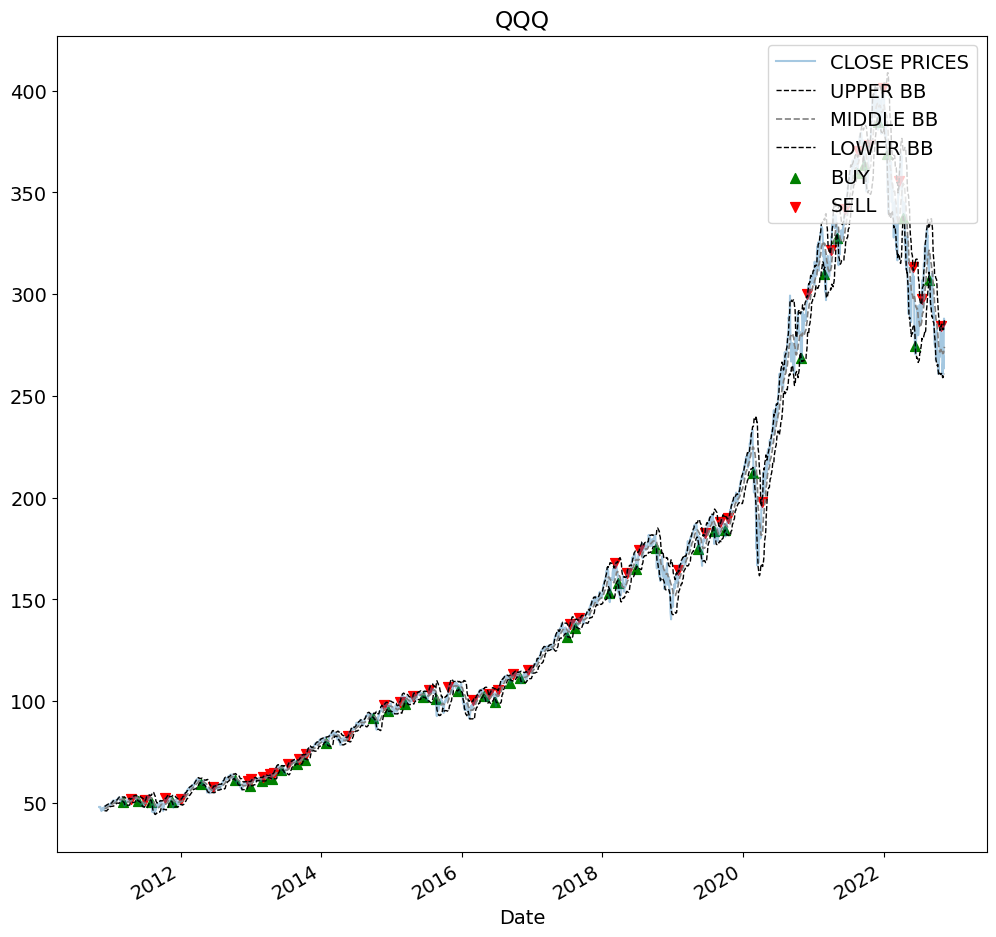

In [6]:
bol_band_strategy("QQQ","1d","2010-11-4","2022-11-15",investment_value = 100000)

In [8]:
#df1.to_excel("bb.xlsx",index=False)

In [9]:
### df2.head(100)

Profit percentage of the BB strategy : 1.97%
Total profit by just investing one time inMNST is1037.56%


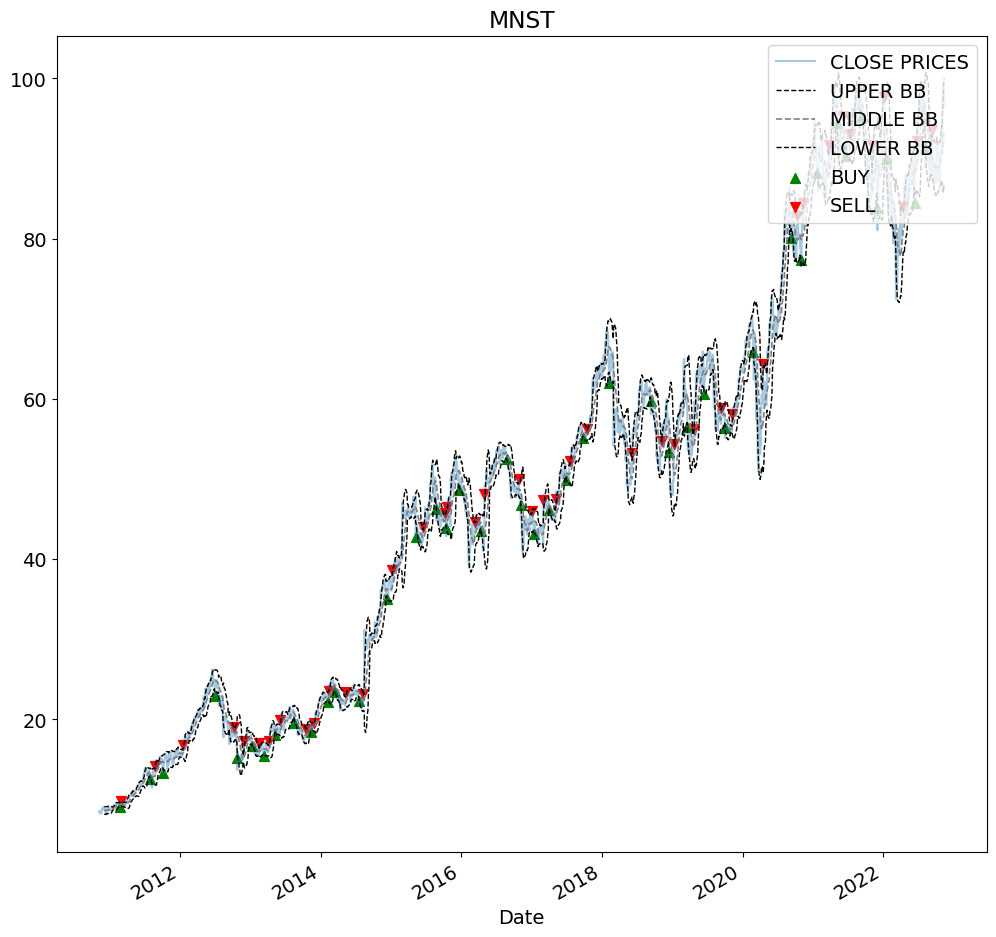

In [9]:
bol_band_strategy("MNST","1d","2010-11-4","2022-11-15",investment_value = 50000)

Profit percentage of the BB strategy : 1.83%
Total profit by just investing one time inDIA is283.83%


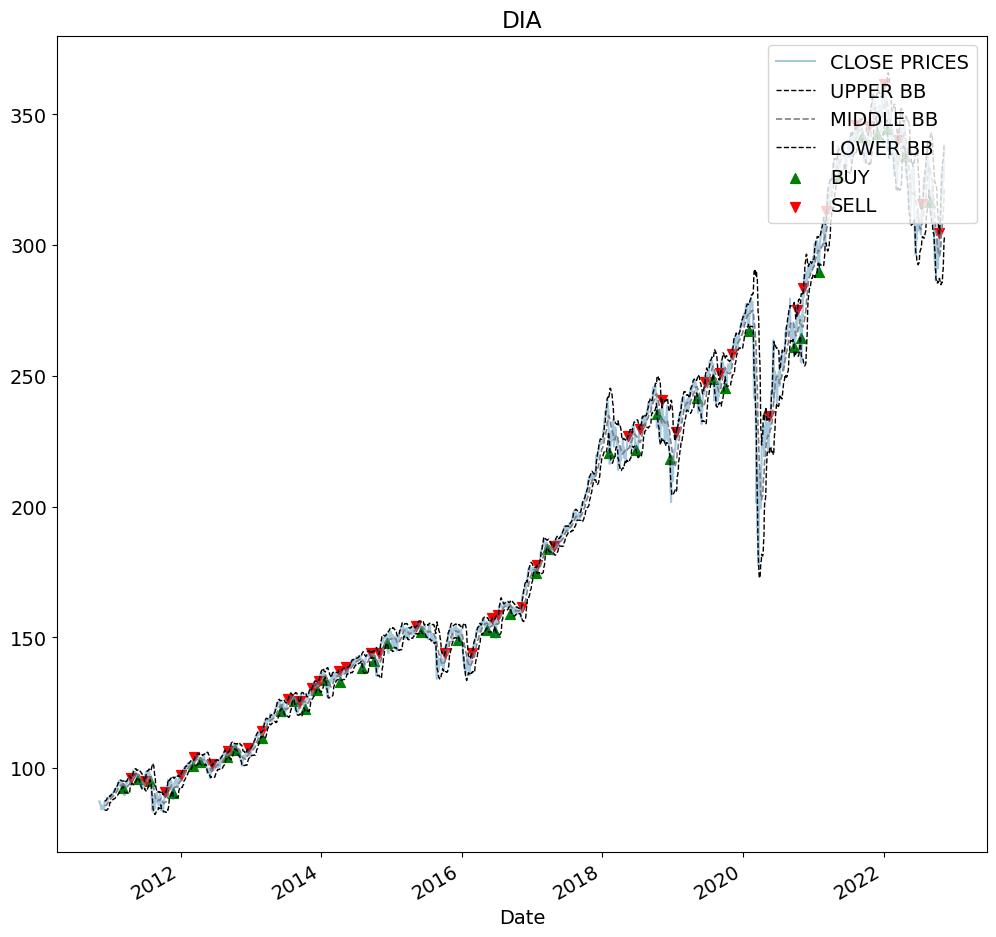

In [10]:
df1=bol_band_strategy("DIA","1d","2010-11-4","2022-11-15",investment_value = 50000)

Profit percentage of the BB strategy : 1.9%
Total profit by just investing one time inSPY is301.06%


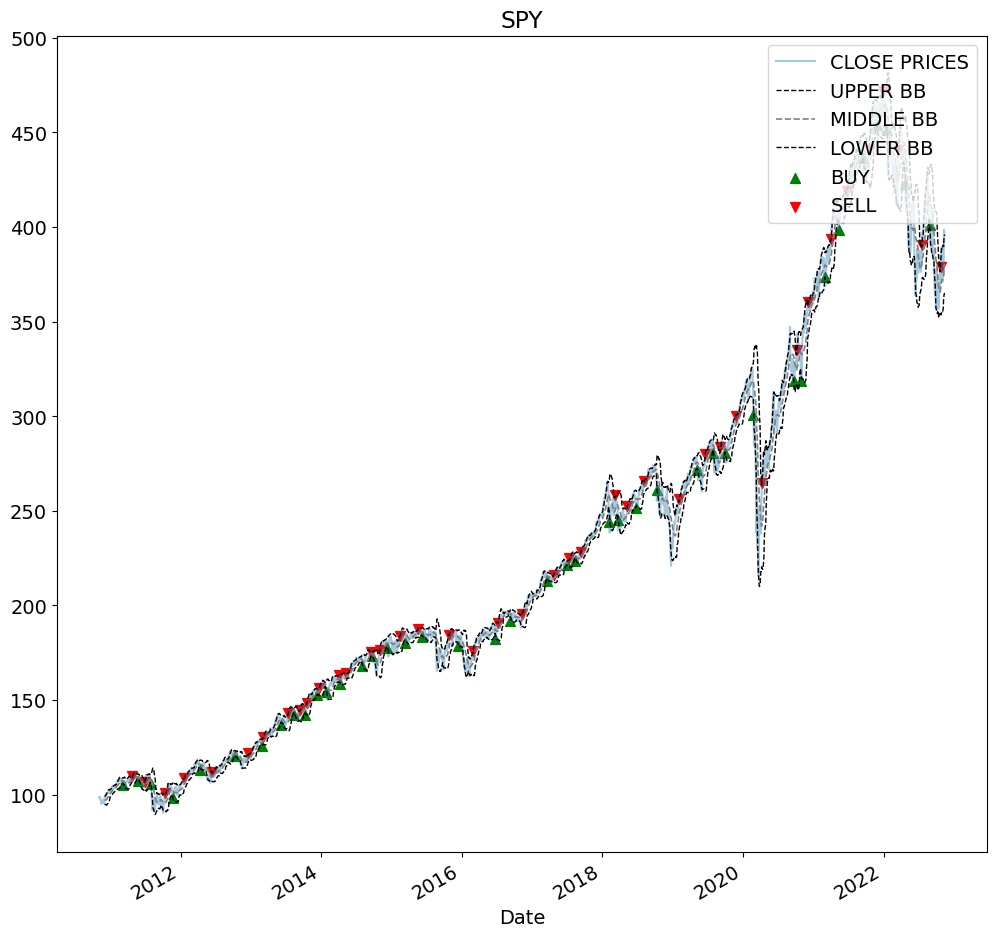

In [11]:
bol_band_strategy("SPY","1d","2010-11-4","2022-11-15",investment_value = 50000)

Profit percentage of the BB strategy : -0.8%
Total profit by just investing one time inF is35.72%


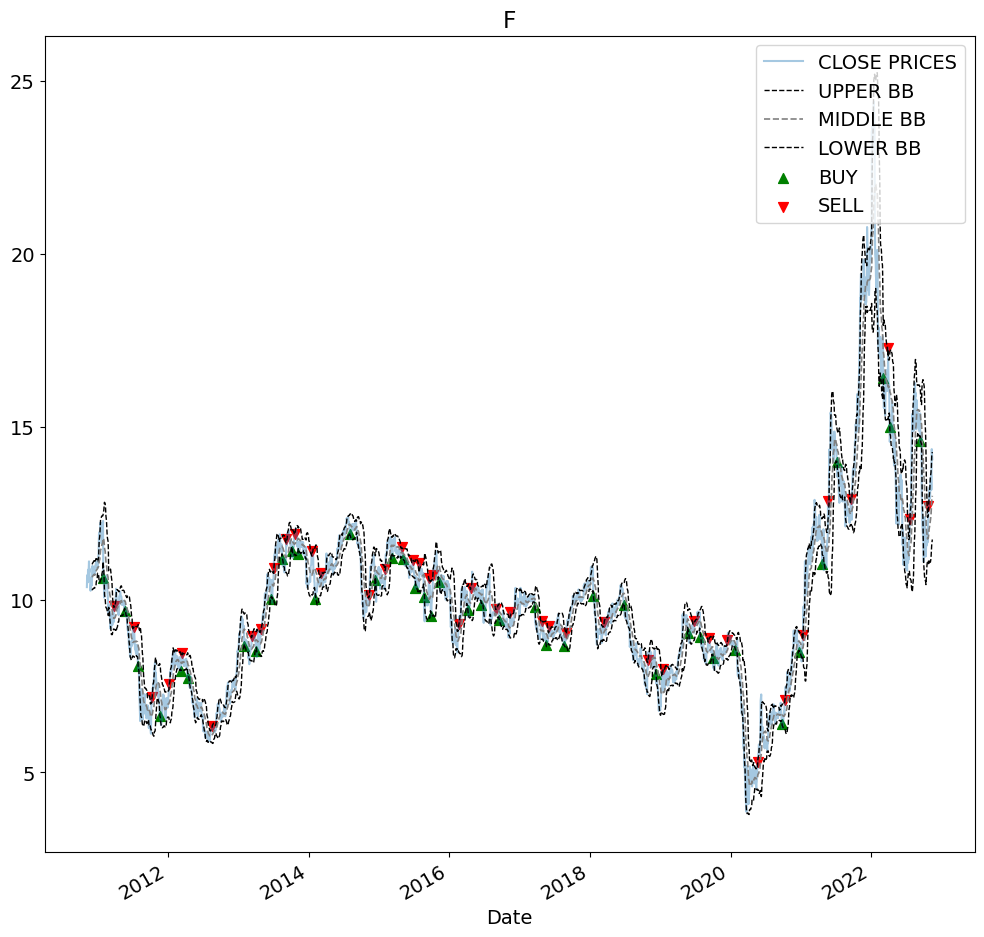

In [12]:
bol_band_strategy("F","1d","2010-11-4","2022-11-15",investment_value = 50000)

### Relative Strength Index Strategy

In [13]:
#%%capture
! pip install pandas-ta

In [14]:
import pandas_ta as ta


In [15]:
## https://technical-analysis-library-in-python.readthedocs.io/en/latest/ta.html?highlight=rsi#momentum-indicators
name = "QQQ"
#def stock(name,start,end):
def rsi_strategy(name="QQQ",frequency="1d",first="2019-11-4", last="2022-11-15",period=14,multiplier=1.7,investment_value = 100000):
    ticker = yfinance.Ticker(name)
    df1 = ticker.history(interval=frequency,start=first,end=last)
    df1['MiddleBand']= df1['Close'].rolling(period).mean()
    df1['UpperBand'] = df1['Close'].rolling(period).mean() + df1['Close'].rolling(period).std() * multiplier
    df1['LowerBand'] = df1['Close'].rolling(period).mean() - df1['Close'].rolling(period).std() * multiplier
    df1['RSI']=ta.momentum.rsi(close=df1['Close'],window=period)
    df1.dropna()
    #return df
    #def implement_bb_strategy(data, lower_bb, upper_bb):
    buy_price = []
    sell_price = []
    bb_signal = []
    signal = -1
    #data=df['Close']
    #lower_bb=df['LowerBand']
    #upper_bb=df['UpperBand']
    
    for i in range(len(df1['RSI'])):
        if df1['RSI'][i-1] >30 and df1['RSI'][i] < 30:
            if signal != 1:
                buy_price.append(df1['Close'][i])
                sell_price.append(np.nan)
                signal = 1
                bb_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                bb_signal.append(0)
        elif df1['RSI'][i-1] < 70 and df1['RSI'][i] > 70:
            if signal != -1:
                buy_price.append(np.nan)
                sell_price.append(df1['Close'][i])
                signal = -1
                bb_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                bb_signal.append(0)
        else:
            buy_price.append(np.nan)
            sell_price.append(np.nan)
            bb_signal.append(0)
    df1['buy_price']=buy_price
    df1['sell_price']=sell_price
    df1['bb_signal']=bb_signal 
    
    position = []
    
    for i in range(len(df1['bb_signal'])):
        if df1['bb_signal'][i] > 1:
            position.append(1)
        else:
            position.append(0)
    
        
    for i in range(len(df1['Close'])):
        if df1['bb_signal'][i] == 1:
            position[i] = 1
        elif df1['bb_signal'][i] == -1:
            position[i] = 0
        else:
            position[i] = position[i-1]
    df1['position']=position
    df1['return']=df1['Close'].diff()
    bb_strategy_ret = []

    for i in range(len(df1['return'])):
        try:
            returns = df1['return'][i]*df1['position'][i]
            bb_strategy_ret.append(returns)
        except:
            pass
    df1['bb_returns']=bb_strategy_ret
    #profit_percentage = round((100*sum(df['buy_price'])-sum(df['sell_price']))/(sum(df['buy_price'])),2)
    #total_buy=np.mean((df1['buy_price']))
    #total_sell=np.mean((df1['sell_price']))
    buy=[item for item in df1['buy_price']  if str(item) != 'nan']
    sell=[item for item in df1['sell_price']  if str(item) != 'nan']
    if len(buy)==len(sell):
        #buy=list
        #buy=[item for item in df1['buy_price']  if str(item) != 'nan']
        total_buy=np.sum(buy)
        total_sell=np.sum(sell)
        buy_sell_diff=total_sell-total_buy
        profit_percentage=round((buy_sell_diff/total_buy)*100,2)
        #print('Profit percentage of the BB strategy : {}%'.format(profit_percentage))
    else:
        total_buy=np.sum(buy[:-1])
        total_sell=np.sum(sell)
        buy_sell_diff=total_sell-total_buy
        profit_percentage=round((buy_sell_diff/total_buy)*100,2)
    #return total_sell,total_buy
    #buy_sell_diff=total_sell-total_buy
    #profit_percentage=round((buy_sell_diff/total_buy)*100,2)
    print('Profit percentage of the RSI strategy : {}%'.format(profit_percentage))
    Profit_oneinvest=round(((df1['Close'][-1]-df1['Close'][0])/(df1['Close'][0])*100),2)
    print('Total profit by just investing one time in{}'.format(name),'is{}%'.format(Profit_oneinvest))
    '''
    return df1
    
    position1 = []
    for i in range(len(df1['bb_signal'])):
        if df1['bb_signal'][i] > 1:
            position1.append(0)
        else:
            position1.append(1)
        
    for i in range(len(df1['bb_signal'])):
        if df1['bb_signal'][i] == 1:
            position1[i] = 1
        elif df1['bb_signal'][i] == -1:
            df1['bb_signal'][i] = 0
        else:
            position1[i] = position1[i-1]
    df1['position']=position1
    df_ret1 = pd.DataFrame(np.diff(df1['Close'])).rename(columns = {0:'returns'})
    bb_strategy_ret1 = []

    for i in range(len(df_ret1)):
        try:
            returns = df_ret1['returns'][i]*df['position'][i]
            bb_strategy_ret1.append(returns)
        except:
            pass
    
    bb_strategy_ret_df = pd.DataFrame(bb_strategy_ret1).rename(columns = {0:'bb_returns'})

    #investment_value = 100000
    #number_of_stocks = math.floor(investment_value/df1['Close'][-1])
    bb_investment_ret = []

    for i in range(len(bb_strategy_ret_df['bb_returns'])):
        returns = math.floor(investment_value/df1['Close'][-1])*bb_strategy_ret_df['bb_returns'][i]
        bb_investment_ret.append(returns)

    bb_investment_ret_df = pd.DataFrame(bb_investment_ret).rename(columns = {0:'investment_returns'})
    total_investment_ret = round(sum(bb_investment_ret_df['investment_returns']), 2)
    profit_percentage = round(((total_investment_ret/investment_value)*100),2)
    Profit_oneinvest=round(((df1['Close'][-1]-df1['Close'][0])/(df1['Close'][0])*100),2)
    print('For total Investment in {}'.format(name),'of ${}'.format(investment_value))
    print('Profit gained from the BB strategy by investing in {}'.format(name),'is {}'.format(total_investment_ret))
    print('Profit percentage of the BB strategy : {}%'.format(profit_percentage))
    print('Total profit by just investing one time in{}'.format(name),'is{}%'.format(Profit_oneinvest))
    '''

    plt.rcParams['figure.figsize'] = [12,12]
    plt.rc('font', size=14)
    ax1 = plt.subplot2grid((10,1), (0,0), rowspan = 4, colspan = 1)
    ax2 = plt.subplot2grid((10,1), (5,0), rowspan = 4, colspan = 1)
    ax1.plot(df1['Close'], linewidth = 2.5)
    ax1.plot(df1.index,df1['buy_price'], marker = '^', color = 'green', label = 'BUY')
    ax1.plot(df1.index,df1['sell_price'], marker = 'v', color = 'red', label = 'SELL')
    ax1.set_title(name)
    ax2.plot(df1['RSI'], color = 'orange', linewidth = 2.5)
    ax2.axhline(30, linestyle = '--', linewidth = 1.5, color = 'grey')
    ax2.axhline(70, linestyle = '--', linewidth = 1.5, color = 'grey')
    ax2.set_title('RELATIVE STRENGTH INDEX')
    plt.show()
    #df['Close'].plot(label = 'CLOSE PRICES', alpha = 0.4)
    #df['UpperBand'].plot(label = 'UPPER BB', linestyle = '--', linewidth = 1, color = 'black')
    #df['MiddleBand'].plot(label = 'MIDDLE BB', linestyle = '--', linewidth = 1.2, color = 'grey')
    #df['LowerBand'].plot(label = 'LOWER BB', linestyle = '--', linewidth = 1, color = 'black')
    #df['RSI'].plot(label = 'RSI', linestyle = '-', linewidth = 1, color = 'blUE')
    #plt.scatter(df.index,df['buy_price'], marker = '^', color = 'green', label = 'BUY', s = 50)
    #plt.scatter(df.index,df['sell_price'], marker = 'v', color = 'red', label = 'SELL', s = 50)
    #plt.title(name)
    #plt.legend(loc = 'upper right')
    #plt.show()
    #plt.rcParams['figure.figsize'] = [16,16]
    plt.rc('font', size=14)
    Candlestick= cf.QuantFig(df1, title=name, legend='top', name=name)
    Candlestick.add_volume() 
    Candlestick.add_rsi(periods=14, color='green') 
    Candlestick.iplot()
    #Candlestick.add_rsi(periods=14, color='green') 
    #Candlestick.add_macd()
    #Candlestick.add_dmi()
    #Candlestick.iplot()
    #Candlestick.add_sma(periods=20, column='Close', color='red')
    #Candlestick.add_ema(periods=20, color='grey')
    #Candlestick.iplot()
    
    

Profit percentage of the RSI strategy : 11.73%
Total profit by just investing one time inQQQ is495.36%


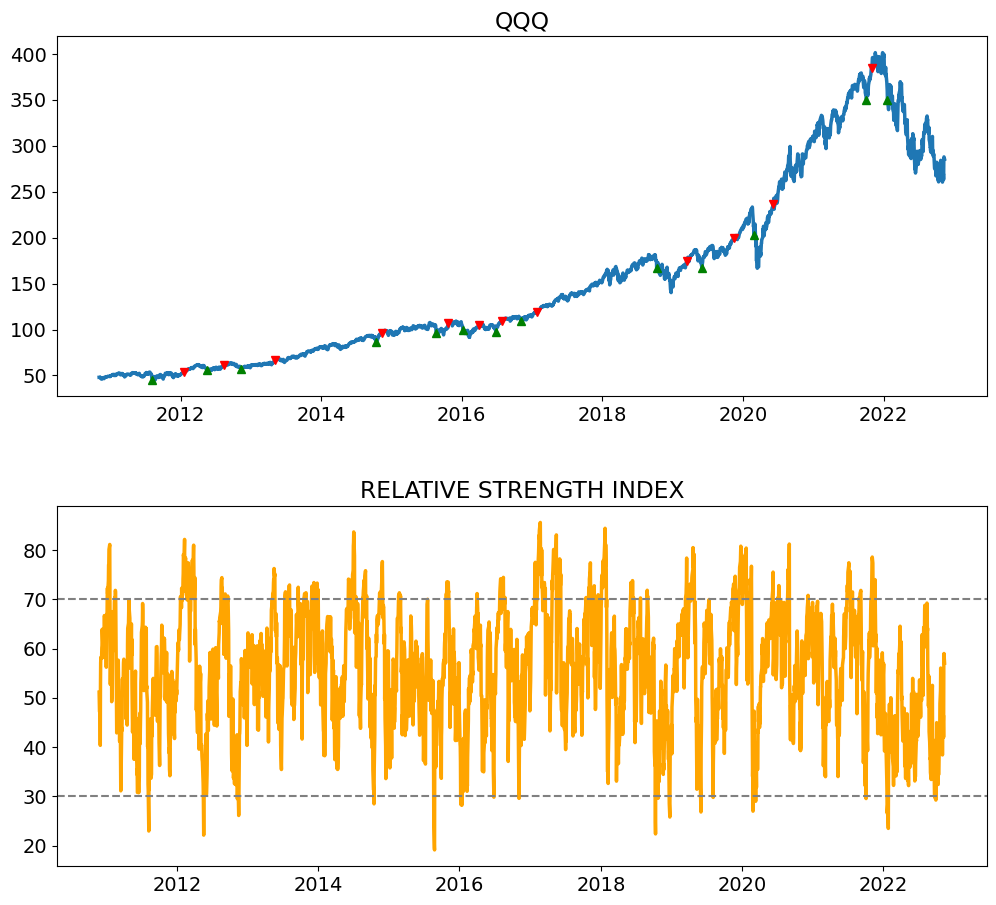

In [16]:
rsi_strategy("QQQ","1d","2010-11-4","2022-11-15",investment_value = 50000)

In [19]:
#df2.to_excel("bb.xlsx",index=False)

Profit percentage of the RSI strategy : 0.38%
Total profit by just investing one time inVTEB is11.19%


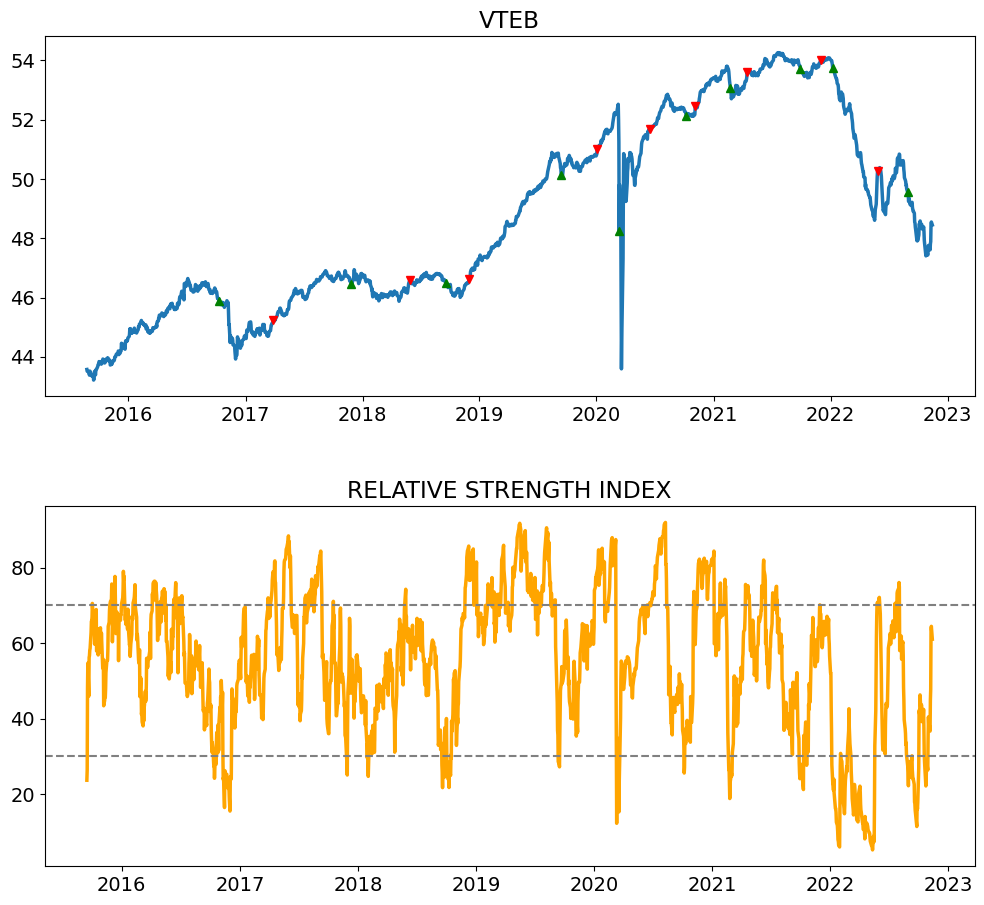

In [20]:
rsi_strategy("VTEB","1d","2010-11-4","2022-11-15",investment_value = 50000)

### MACD Strategy

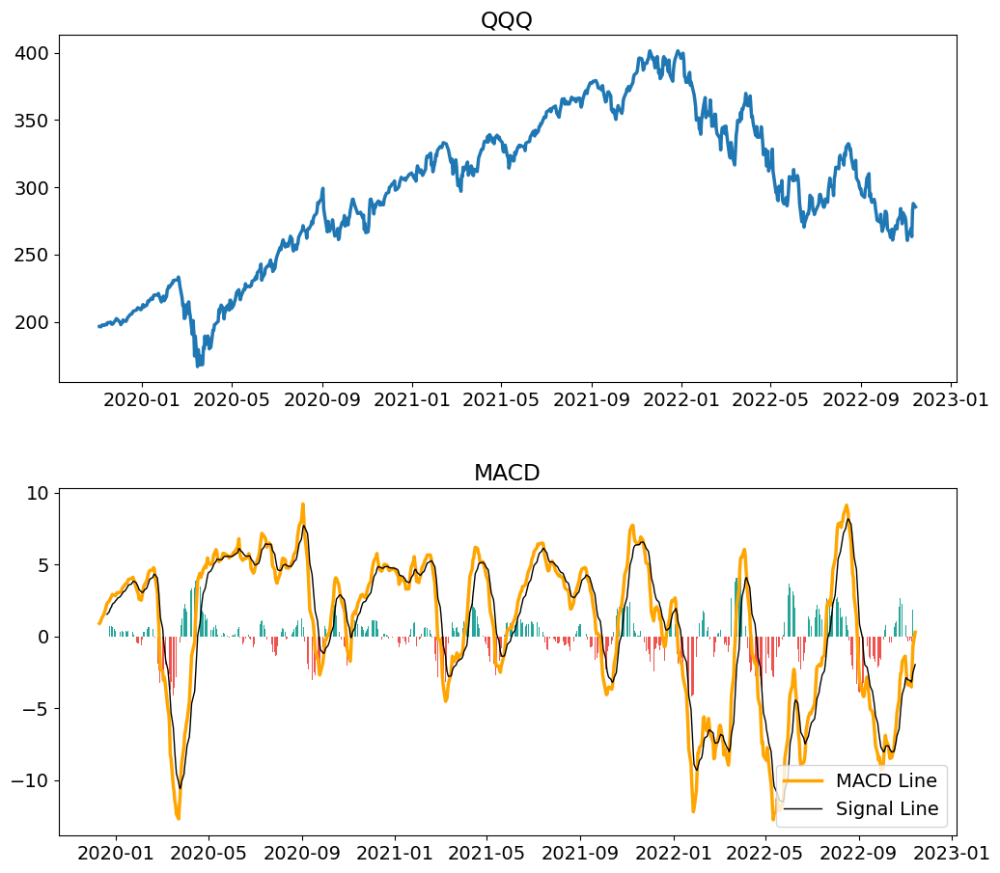

"\ndef plot_macd(prices, macd, signal, hist):\n    ax1 = plt.subplot2grid((8,1), (0,0), rowspan = 5, colspan = 1)\n    ax2 = plt.subplot2grid((8,1), (5,0), rowspan = 3, colspan = 1)\n\n    ax1.plot(prices)\n    ax2.plot(macd, color = 'grey', linewidth = 1.5, label = 'MACD')\n    ax2.plot(signal, color = 'skyblue', linewidth = 1.5, label = 'SIGNAL')\n\n    for i in range(len(prices)):\n        if str(hist[i])[0] == '-':\n            ax2.bar(prices.index[i], hist[i], color = '#ef5350')\n        else:\n            ax2.bar(prices.index[i], hist[i], color = '#26a69a')\n\n    plt.legend(loc = 'lower right')\n\nplot_macd(googl['close'], googl_macd['macd'], googl_macd['signal'], googl_macd['hist'])\n"

In [70]:
### https://medium.com/codex/algorithmic-trading-with-macd-in-python-1c2769a6ad1b
### https://www.alpharithms.com/calculate-macd-python-272222/
#import plotly
name='QQQ'
frequency='1d'
first="2019-11-4"
last="2022-11-15"
period=14
multiplier=1.7
ticker = yfinance.Ticker(name)
df = ticker.history(interval=frequency,start=first,end=last)
df['MiddleBand']= df['Close'].rolling(period).mean()
df['UpperBand'] = df['Close'].rolling(period).mean() + df['Close'].rolling(period).std() * multiplier
df['LowerBand'] = df['Close'].rolling(period).mean() - df['Close'].rolling(period).std() * multiplier
df['RSI']=ta.momentum.rsi(close=df['Close'],window=period)
df.ta.macd(close='Close', fast=12, slow=26, signal=9, append=True)
#df2=pd.concat([df, df1], axis=1)
#df.info()
#df.dropna()
#df.info()
# get ticker data
#df = yf.Ticker('BTC-USD').history(period='1y')[map(str.title, ['open', 'close', 'low', 'high', 'volume'])]

# calculate MACD values
#df.ta.macd(close='close', fast=12, slow=26, append=True)

# Force lowercase (optional)
#df.columns = [x.lower() for x in df.columns]

plt.rcParams['figure.figsize'] = [12,12]
plt.rc('font', size=14)
ax1 = plt.subplot2grid((10,1), (0,0), rowspan = 4, colspan = 1)
ax2 = plt.subplot2grid((10,1), (5,0), rowspan = 4, colspan = 1)
ax1.plot(df['Close'], linewidth = 2.5)
#ax1.plot(df.index,df1['buy_price'], marker = '^', color = 'green', label = 'BUY')
#ax1.plot(df.index,df1['sell_price'], marker = 'v', color = 'red', label = 'SELL')
ax1.set_title(name)
ax2.plot(df['MACD_12_26_9'], color = 'orange', linewidth = 2.5,label='MACD Line')
ax2.plot(df['MACDs_12_26_9'], color = 'black', linewidth = 1.0,label='Signal Line')
for i in range(len(df['MACDh_12_26_9'])):
        if df['MACDh_12_26_9'][i] < 0:
            ax2.bar(df.index[i], df['MACDh_12_26_9'][i], color = '#ef5350')
        else:
            ax2.bar(df.index[i], df['MACDh_12_26_9'][i], color = '#26a69a')

plt.legend(loc = 'lower right')
#ax2.bar(df.index,df['MACDh_12_26_9'], color = 'blue',label='MACD-Signal')
#ax2.axhline(30, linestyle = '--', linewidth = 1.5, color = 'grey')
#ax2.axhline(70, linestyle = '--', linewidth = 1.5, color = 'grey')
ax2.set_title('MACD')
plt.show()
plt.rc('font', size=14)
Candlestick= cf.QuantFig(df, title=name, legend='top', name=name)
Candlestick.add_volume() 
Candlestick.add_macd() 
Candlestick.iplot()

'''
# Construct a 2 x 1 Plotly figure
fig = make_subplots(rows=2, cols=1)

# price Line
fig.append_trace(
    go.Scatter(
        x=df.index,
        y=df['open'],
        line=dict(color='#ff9900', width=1),
        name='open',
        # showlegend=False,
        legendgroup='1',

    ), row=1, col=1
)

# Candlestick chart for pricing
fig.append_trace(
    go.Candlestick(
        x=df.index,
        open=df['open'],
        high=df['high'],
        low=df['low'],
        close=df['close'],
        increasing_line_color='#ff9900',
        decreasing_line_color='black',
        showlegend=False

    ), row=1, col=1
)

# Fast Signal (%k)
fig.append_trace(
    go.Scatter(
        x=df.index,
        y=df['macd_12_26_9'],
        line=dict(color='#ff9900', width=2),
        name='macd',
        # showlegend=False,
        legendgroup='2',

    ), row=2, col=1
)

# Slow signal (%d)
fig.append_trace(
    go.Scatter(
        x=df.index,
        y=df['macds_12_26_9'],
        line=dict(color='#000000', width=2),
        # showlegend=False,
        legendgroup='2',
        name='signal'
    ), row=2, col=1
)

# Colorize the histogram values
colors = np.where(df['macdh_12_26_9'] < 0, '#000', '#ff9900')

# Plot the histogram
fig.append_trace(
    go.Bar(
        x=df.index,
        y=df['macdh_12_26_9'],
        name='histogram',
        marker_color=colors,

    ), row=2, col=1
)

# Make it pretty
layout = go.Layout(
    plot_bgcolor='#efefef',
    # Font Families
    font_family='Monospace',
    font_color='#000000',
    font_size=20,
    xaxis=dict(
        rangeslider=dict(
            visible=False
        )
    )
)

# Update options and show plot
fig.update_layout(layout)
fig.show()
#df1.dropna()
'''
'''
def plot_macd(prices, macd, signal, hist):
    ax1 = plt.subplot2grid((8,1), (0,0), rowspan = 5, colspan = 1)
    ax2 = plt.subplot2grid((8,1), (5,0), rowspan = 3, colspan = 1)

    ax1.plot(prices)
    ax2.plot(macd, color = 'grey', linewidth = 1.5, label = 'MACD')
    ax2.plot(signal, color = 'skyblue', linewidth = 1.5, label = 'SIGNAL')

    for i in range(len(prices)):
        if str(hist[i])[0] == '-':
            ax2.bar(prices.index[i], hist[i], color = '#ef5350')
        else:
            ax2.bar(prices.index[i], hist[i], color = '#26a69a')

    plt.legend(loc = 'lower right')

plot_macd(googl['close'], googl_macd['macd'], googl_macd['signal'], googl_macd['hist'])
'''

## Checking Data 

## Implementing buy and sell strategy using bollinger bands

In [ ]:
##https://medium.com/codex/algorithmic-trading-with-bollinger-bands-in-python-1b0a00c9ef99
#https://medium.com/codex/algorithmic-trading-with-bollinger-bands-in-python-1b0a00c9ef99
def implement_bb_strategy(data, lower_bb, upper_bb):
    buy_price = []
    sell_price = []
    bb_signal = []
    signal = 0
    
    for i in range(len(data)):
        if data[i-1] > lower_bb[i-1] and data[i] < lower_bb[i]:
            if signal != 1:
                buy_price.append(data[i])
                sell_price.append(np.nan)
                signal = 1
                bb_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                bb_signal.append(0)
        elif data[i-1] < upper_bb[i-1] and data[i] > upper_bb[i]:
            if signal != -1:
                buy_price.append(np.nan)
                sell_price.append(data[i])
                signal = -1
                bb_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                bb_signal.append(0)
        else:
            buy_price.append(np.nan)
            sell_price.append(np.nan)
            bb_signal.append(0)
        position = []
    for i in range(len(bb_signal)):
        if bb_signal[i] > 1:
        position.append(0)
    else:
        position.append(1)
        
    for i in range(len(df['Close'])):
        if bb_signal[i] == 1:
        position[i] = 1
    elif bb_signal[i] == -1:
        position[i] = 0
    else:
        position[i] = position[i-1]
        
    upper_bb = df['UpperBand']
    lower_bb = df['LowerBand']
    close_price = df['Close']
    bb_signal = pd.DataFrame(bb_signal).rename(columns = {0:'bb_signal'}).set_index(df.index)
    position = pd.DataFrame(position).rename(columns = {0:'bb_position'}).set_index(df.index)

    frames = [close_price, upper_bb, lower_bb, bb_signal, position]
    strategy = pd.concat(frames, join = 'inner', axis = 1)
    strategy = strategy.reset_index().drop('Date', axis = 1)

            
    return buy_price, sell_price, bb_signal

buy_price, sell_price, bb_signal = implement_bb_strategy(df['Close'], df['LowerBand'], df['UpperBand'])


### Investment strategy

#### Creating a  position list to see if we already have the stock: 1 if we already own the stock 

In [ ]:
position = []
for i in range(len(bb_signal)):
    if bb_signal[i] > 1:
        position.append(0)
    else:
        position.append(1)
        
for i in range(len(df['Close'])):
    if bb_signal[i] == 1:
        position[i] = 1
    elif bb_signal[i] == -1:
        position[i] = 0
    else:
        position[i] = position[i-1]
        
upper_bb = df['UpperBand']
lower_bb = df['LowerBand']
close_price = df['Close']
bb_signal = pd.DataFrame(bb_signal).rename(columns = {0:'bb_signal'}).set_index(df.index)
position = pd.DataFrame(position).rename(columns = {0:'bb_position'}).set_index(df.index)

frames = [close_price, upper_bb, lower_bb, bb_signal, position]
strategy = pd.concat(frames, join = 'inner', axis = 1)
strategy = strategy.reset_index().drop('Date', axis = 1)

strategy

### Plotting Buyback signals on bollinger bands

In [ ]:
plt.rcParams['figure.figsize'] = [24,24]
plt.rc('font', size=14)
df['Close'].plot(label = 'CLOSE PRICES', alpha = 0.4)
df['UpperBand'].plot(label = 'UPPER BB', linestyle = '--', linewidth = 1, color = 'black')
df['MiddleBand'].plot(label = 'MIDDLE BB', linestyle = '--', linewidth = 1.2, color = 'grey')
df['LowerBand'].plot(label = 'LOWER BB', linestyle = '--', linewidth = 1, color = 'black')
plt.scatter(df.index, buy_price, marker = '^', color = 'green', label = 'BUY', s = 50)
plt.scatter(df.index, sell_price, marker = 'v', color = 'red', label = 'SELL', s = 50)
plt.title('QQQ BB STRATEGY TRADING SIGNALS')
plt.legend(loc = 'upper right')
plt.show()

__Back Testing to see how the trading strategy is working__

In [ ]:
import math
df_ret = pd.DataFrame(np.diff(df['Close'])).rename(columns = {0:'returns'})
bb_strategy_ret = []

for i in range(len(df_ret)):
    try:
        returns = df_ret['returns'][i]*strategy['bb_position'][i]
        bb_strategy_ret.append(returns)
    except:
        pass
    
bb_strategy_ret_df = pd.DataFrame(bb_strategy_ret).rename(columns = {0:'bb_returns'})

investment_value = 100000
number_of_stocks = math.floor(investment_value/df['Close'][-1])
bb_investment_ret = []

for i in range(len(bb_strategy_ret_df['bb_returns'])):
    returns = number_of_stocks*bb_strategy_ret_df['bb_returns'][i]
    bb_investment_ret.append(returns)

bb_investment_ret_df = pd.DataFrame(bb_investment_ret).rename(columns = {0:'investment_returns'})
total_investment_ret = round(sum(bb_investment_ret_df['investment_returns']), 2)
profit_percentage = math.floor((total_investment_ret/investment_value)*100)
print('Profit gained from the BB strategy by investing $100k in df : {}'.format(total_investment_ret))
print('Profit percentage of the BB strategy : {}%'.format(profit_percentage))


### Using cufflinks for displaying bollingerband with candlestick

In [ ]:
%%capture
## https://github.com/Worlddatascience/DataScienceCohort/blob/master/6_How_to_Create_a_Candlestick_Chart_using_Python.ipynb
!pip install cufflinks
## Code to Install Backtrader
!pip install backtrader 
import cufflinks as cf   #A powerful data visualization library used for Financial Data Science processes
from plotly.offline import iplot, init_notebook_mode #Plotly and cufflinks work in conjunction

cf.go_offline() #gives ability to plot offline
init_notebook_mode() #gives ability to plot things proportionately in the notebook


In [ ]:
plt.rcParams['figure.figsize'] = [24,24]
plt.rc('font', size=14)
Candlestick= cf.QuantFig(df, title='QQQ', legend='top', name='QQQ')

In [ ]:
Candlestick.add_bollinger_bands(periods=20, boll_std=2, fill=True, column='Close')
Candlestick.add_volume() 
#Candlestick.add_dmi()#Adding parameters for a Volume chart (measure of shares and trading volume over a specified time)
#Candlestick.add_sma(periods=20, column='Close', color='red') #Simple Moving Average for a 20 day period 
#A 20-day moving average would average out the closing prices for the first 20 days as the first data point.
#Candlestick.add_ema(periods=20, color='green') #Exponential Moving Average for a 20 day period

In [ ]:
Candlestick.iplot()


In [ ]:
name = "QQQ"
#def stock(name,start,end):
def RSI_strategy(name="QQQ",window="1d",first="2019-11-4", last="2022-11-15",period=20,multiplier=1.7,investment_value = 100000):
    ticker = yfinance.Ticker(name)
    df = ticker.history(interval=window,start=first,end=last)
    df['MiddleBand']= df['Close'].rolling(period).mean()
    df['UpperBand'] = df['Close'].rolling(period).mean() + df['Close'].rolling(period).std() * multiplier
    df['LowerBand'] = df['Close'].rolling(period).mean() - df['Close'].rolling(period).std() * multiplier
    #return df
    #def implement_bb_strategy(data, lower_bb, upper_bb):
    buy_price = []
    sell_price = []
    bb_signal = []
    signal = 0
    #data=df['Close']
    #lower_bb=df['LowerBand']
    #upper_bb=df['UpperBand']
    
    for i in range(len(df['Close'])):
        if df['Close'][i-1] > df['LowerBand'][i-1] and df['Close'][i] < df['UpperBand'][i]:
            if signal != 1:
                buy_price.append(df['Close'][i])
                sell_price.append(np.nan)
                signal = 1
                bb_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                bb_signal.append(0)
        elif df['Close'][i-1] < df['UpperBand'][i-1] and df['Close'][i] > df['UpperBand'][i]:
            if signal != -1:
                buy_price.append(np.nan)
                sell_price.append(df['Close'][i])
                signal = -1
                bb_signal.append(signal)
            else:
                buy_price.append(np.nan)
                sell_price.append(np.nan)
                bb_signal.append(0)
        else:
            buy_price.append(np.nan)
            sell_price.append(np.nan)
            bb_signal.append(0)
    df['buy_price']=buy_price
    df['sell_price']=sell_price
    df['bb_signal']=bb_signal 
        
    #return df
    position = []
    for i in range(len(df['bb_signal'])):
        if df['bb_signal'][i] > 1:
            position.append(0)
        else:
            position.append(1)
        
    for i in range(len(df['Close'])):
        if df['bb_signal'][i] == 1:
            position[i] = 1
        elif df['bb_signal'][i] == -1:
            df['bb_signal'][i] = 0
        else:
            position[i] = position[i-1]
    df['position']=position
    df_ret = pd.DataFrame(np.diff(df['Close'])).rename(columns = {0:'returns'})
    bb_strategy_ret = []

    for i in range(len(df_ret)):
        try:
            returns = df_ret['returns'][i]*df['position'][i]
            bb_strategy_ret.append(returns)
        except:
            pass
    
    bb_strategy_ret_df = pd.DataFrame(bb_strategy_ret).rename(columns = {0:'bb_returns'})

    #investment_value = 100000
    number_of_stocks = math.floor(investment_value/df['Close'][-1])
    bb_investment_ret = []

    for i in range(len(bb_strategy_ret_df['bb_returns'])):
        returns = number_of_stocks*bb_strategy_ret_df['bb_returns'][i]
        bb_investment_ret.append(returns)

    bb_investment_ret_df = pd.DataFrame(bb_investment_ret).rename(columns = {0:'investment_returns'})
    total_investment_ret = round(sum(bb_investment_ret_df['investment_returns']), 2)
    profit_percentage = round(((total_investment_ret/investment_value)*100),2)
    Profit_oneinvest=round(((df['Close'][-1]-df['Close'][0])/(df['Close'][0])*100),2)
    print('For total Investment in {}'.format(name),'of ${}'.format(investment_value))
    print('Profit gained from the BB strategy by investing in {}'.format(name),'is {}'.format(total_investment_ret))
    print('Profit percentage of the BB strategy : {}%'.format(profit_percentage))
    print('Total profit by just investing one time in{}'.format(name),'is{}%'.format(Profit_oneinvest))

    plt.rcParams['figure.figsize'] = [12,12]
    plt.rc('font', size=14)
    df['Close'].plot(label = 'CLOSE PRICES', alpha = 0.4)
    df['UpperBand'].plot(label = 'UPPER BB', linestyle = '--', linewidth = 1, color = 'black')
    df['MiddleBand'].plot(label = 'MIDDLE BB', linestyle = '--', linewidth = 1.2, color = 'grey')
    df['LowerBand'].plot(label = 'LOWER BB', linestyle = '--', linewidth = 1, color = 'black')
    plt.scatter(df.index,df['buy_price'], marker = '^', color = 'green', label = 'BUY', s = 50)
    plt.scatter(df.index,df['sell_price'], marker = 'v', color = 'red', label = 'SELL', s = 50)
    plt.title(name)
    plt.legend(loc = 'upper right')
    plt.show()
    plt.rcParams['figure.figsize'] = [16,16]
    plt.rc('font', size=14)
    Candlestick= cf.QuantFig(df, title=name, legend='top', name=name)
    Candlestick.add_volume() 
    Candlestick.add_rsi(periods=14, color='green') 
    Candlestick.iplot()
    #Candlestick.add_rsi(periods=14, color='green') 
    #Candlestick.add_macd()
    #Candlestick.add_dmi()
    #Candlestick.iplot()
    #Candlestick.add_sma(periods=20, column='Close', color='red')
    #Candlestick.add_ema(periods=20, color='grey')
    #Candlestick.iplot()
    